In [1]:
from fastai.vision.all import *
import pandas as pd
from sklearn.model_selection import train_test_split

In [2]:
path = Path('/kaggle/input/art-material-data/data/')  
print(type(path))

<class 'pathlib.PosixPath'>


# dataloader

In [3]:
# Tạo ImageDataLoaders
dls = ImageDataLoaders.from_folder(
    path,                     # Thư mục gốc
    valid_pct=0.2,            # Chia 20% dữ liệu cho tập valid
    seed=42,                  # Đảm bảo chia dữ liệu ngẫu nhiên nhưng có thể tái lặp
    item_tfms=Resize(224),    # Resize hình ảnh về kích thước 224x224
    batch_tfms=aug_transforms( # Transform áp dụng trên batch
        flip_vert=True,
        max_rotate=10,
        max_zoom=1.2,
        max_lighting=0.2,
        max_warp=0.2
    ),
    # bs=128        # Batch size (mặc định là 64)
)
dls.train.shuffle = True

In [4]:
# import torch
# import shutil
# import os
# import random
# from collections import Counter
# from torch.utils.data import WeightedRandomSampler
# from fastai.vision.all import *
# from PIL import Image

# # Định nghĩa đường dẫn
# original_path = Path('/kaggle/input/art-material-data/data/')  # Thư mục chứa dữ liệu gốc
# new_path = Path("/kaggle/working/data")  # Thư mục mới chứa dữ liệu đã lấy mẫu và tăng cường
# new_path.mkdir(parents=True, exist_ok=True)

# # Lấy danh sách nhãn và đường dẫn ảnh từ tập train
# labels = [dls.train_ds[i][1] for i in range(len(dls.train_ds))]
# image_paths = [dls.train_ds.items[i] for i in range(len(dls.train_ds))]  # Lấy đường dẫn ảnh

# # Đếm số lượng ảnh mỗi lớp
# class_counts = Counter(labels)

# # Tạo trọng số nghịch đảo (các lớp ít dữ liệu có trọng số lớn hơn)
# weights = {c: 1.0 / class_counts[c] for c in class_counts}
# sample_weights = [weights[label] for label in labels]

# # Tạo WeightedRandomSampler
# sampler = WeightedRandomSampler(sample_weights, num_samples=len(labels), replacement=True)

# # Tạo thư mục con theo nhãn trong new_path
# for c in class_counts.keys():
#     (new_path / str(c)).mkdir(parents=True, exist_ok=True)

# def augment_image(image):
#     tfms = aug_transforms(mult=1.0, do_flip=True, flip_vert=True, max_rotate=10.0, 
#                           min_zoom=0.8, max_zoom=1.2, max_lighting=0.2, 
#                           max_warp=0.2, p_affine=0.75, p_lighting=0.75)
#     pipeline = Pipeline(tfms)  # Tạo pipeline chứa các phép biến đổi
#     return pipeline(image)

# # Lấy mẫu, áp dụng tăng cường dữ liệu và lưu vào thư mục mới
# for idx in sampler:
#     img_path = image_paths[idx]
#     label = labels[idx]
#     new_img_path = new_path / str(label) / img_path.name
    
#     # Đọc ảnh gốc
#     img = Image.open(img_path).convert("RGB")
    
#     # Áp dụng tăng cường dữ liệu ngẫu nhiên 2 lần (có thể điều chỉnh số lần)
#     for i in range(2):
#         augmented_img = augment_image(img)
#         augmented_img_path = new_path / str(label) / f"{img_path.stem}_aug{i}.jpg"
#         augmented_img.save(augmented_img_path)

#     # Sao chép ảnh gốc (tùy chọn)
#     shutil.copy(img_path, new_img_path)

# # Tạo DataLoaders từ thư mục mới
# dls_balanced_aug = ImageDataLoaders.from_folder(new_path, valid_pct=0.2, 
#                                                 item_tfms=Resize(224), batch_tfms=aug_transforms(),
#                                                 bs=64)

# # Kiểm tra số lượng mẫu mỗi lớp trong tập train mới
# print(dls_balanced_aug.train_ds.vocab)  # Danh sách các lớp
# print(Counter([dls_balanced_aug.train_ds[i][1] for i in range(len(dls_balanced_aug.train_ds))]))  # Số lượng mỗi lớp


# data augmentation and class balancing

In [5]:
# # Lấy danh sách nhãn từ tập train
# labels = [dls.train_ds[i][1] for i in range(len(dls.train_ds))]  

# # Đếm số lượng ảnh mỗi lớp
# class_counts = torch.tensor([labels.count(c) for c in set(labels)])  
# print(class_counts)

# # Tính trọng số nghịch đảo (giá trị lớn hơn cho lớp ít dữ liệu)
# weights = 1.0 / class_counts.float()
# # Tạo WeightedRandomSampler
# sampler = torch.utils.data.WeightedRandomSampler(weights, len(labels))

# # Áp dụng sampler vào DataLoader của FastAI
# dls.train.shuffle = True
# dls.train.sampler = sampler

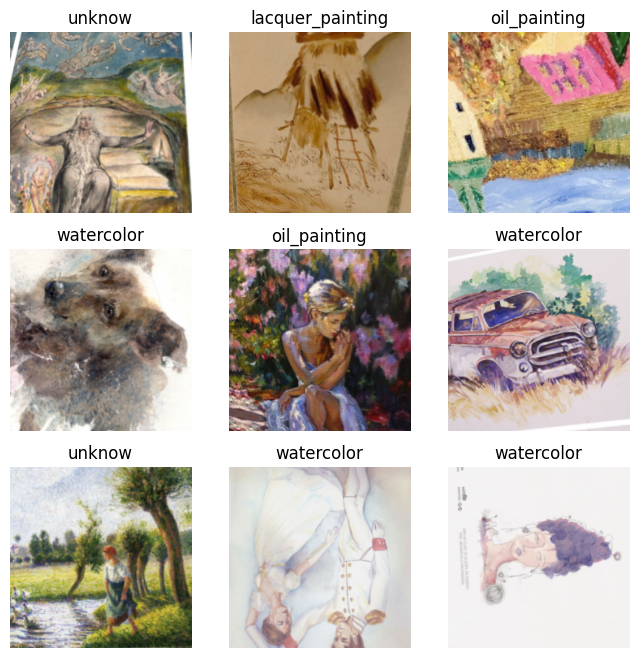

In [6]:
dls.show_batch(max_n=9, figsize=(8, 8))

# model

In [7]:
from timm import create_model
vit_model = create_model('vit_base_patch16_224', pretrained=True, num_classes=dls.c)
# vit_model = create_model('swin_base_patch4_window7_224', pretrained=True, num_classes=dls.c)

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

In [8]:
from fastai.losses import LabelSmoothingCrossEntropy
from fastai.vision.all import *
from fastai.metrics import Precision, Recall, F1Score, accuracy
from fastai.losses import FocalLossFlat

learn = Learner(
    dls, vit_model.cuda(), 
    metrics=[
        accuracy, 
        Precision(average='macro'), 
        Recall(average='macro'), 
        F1Score(average='macro')  # Thay vì average='binary'
    ],  
    # loss_func = FocalLossFlat() ,
    path='/kaggle/working',  
    model_dir='/kaggle/working/models'
)


In [9]:
learn.dls.cuda()

# training
## find learning rate

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwargs

result: SuggestedLRs(valley=4.365158383734524e-05)


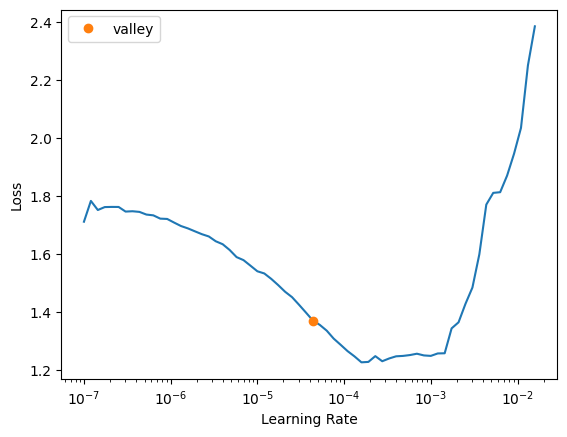

In [10]:
#finds the ideal learning rate
lr_result = learn.lr_find()
print("result:",lr_result)

# fine-tuning

In [11]:
import time

start_time = time.time()  # Bắt đầu đo
learn.fine_tune(10, base_lr=lr_result.valley)

epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,0.483459,0.245170,0.910248,0.907386,0.871313,0.884946,02:09


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,0.118123,0.124138,0.961822,0.957986,0.948306,0.952541,02:07
1,0.113018,0.114616,0.966510,0.965853,0.948122,0.956330,02:07
2,0.106390,0.136619,0.958473,0.956703,0.946509,0.950949,02:07
3,0.086844,0.215313,0.924983,0.921966,0.923874,0.919811,02:08
4,0.052604,0.101858,0.964501,0.952059,0.955450,0.953664,02:07
5,0.026232,0.121346,0.965841,0.960127,0.953504,0.956436,02:07
6,0.016759,0.101305,0.973878,0.972761,0.957902,0.964940,02:08
7,0.008851,0.118134,0.971869,0.968495,0.956981,0.962237,02:07
8,0.005287,0.106146,0.972539,0.971424,0.957067,0.963892,02:08
9,0.004438,0.103034,0.974548,0.972475,0.960876,0.966408,02:08


In [12]:
end_time = time.time()  # Kết thúc đo

train_time = end_time - start_time
print(f"Training time: {train_time:.2f} seconds")

Training time: 1409.65 seconds


<Axes: title={'center': 'learning curve'}, xlabel='steps', ylabel='loss'>

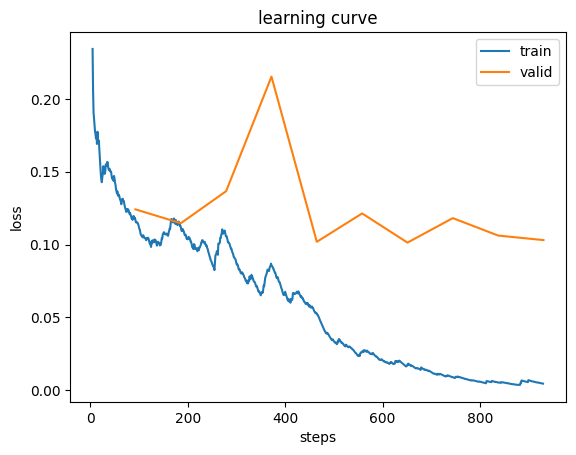

In [13]:
learn.recorder.plot_loss()

In [14]:
learn.export('model.pkl')  # Lưu model, dataloader, transforms

# inference and evaluate

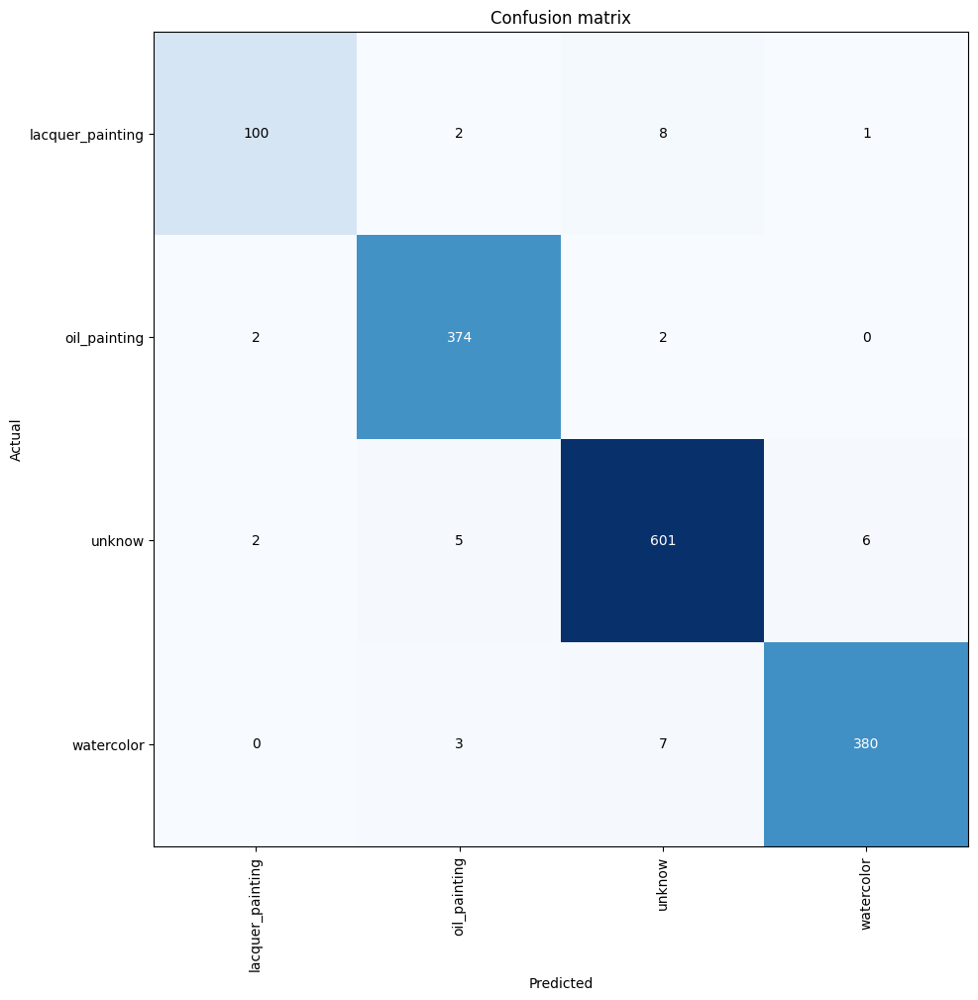

In [15]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(10, 10))

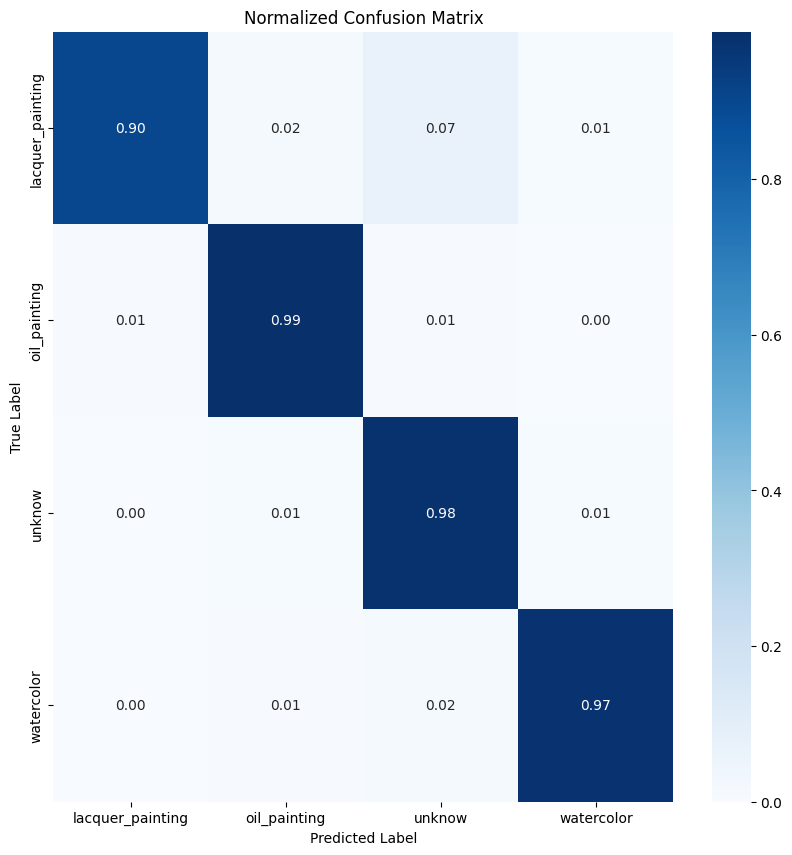

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

cm = interp.confusion_matrix()

# Chuẩn hóa ma trận (mỗi hàng chia cho tổng số phần tử trong hàng đó)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

# Vẽ heatmap với Seaborn
plt.figure(figsize=(10, 10))
sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues", xticklabels=interp.vocab, yticklabels=interp.vocab)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Normalized Confusion Matrix")
plt.show()

In [17]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Lấy dự đoán và nhãn thực tế từ mô hình
preds, targs = learn.get_preds()

# Chuyển đổi dự đoán xác suất thành nhãn
y_pred = preds.argmax(dim=1).numpy()
y_true = targs.numpy()

# Tính các chỉ số đánh giá
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


Accuracy: 0.9745
Precision: 0.9745
Recall: 0.9745
F1 Score: 0.9744


In [18]:
from sklearn.metrics import classification_report

# In báo cáo đánh giá
print(classification_report(y_true, y_pred, target_names=interp.vocab))

                  precision    recall  f1-score   support

lacquer_painting       0.96      0.90      0.93       111
    oil_painting       0.97      0.99      0.98       378
          unknow       0.97      0.98      0.98       614
      watercolor       0.98      0.97      0.98       390

        accuracy                           0.97      1493
       macro avg       0.97      0.96      0.97      1493
    weighted avg       0.97      0.97      0.97      1493



/usr/local/lib/python3.10/dist-packages/fastai/torch_core.py:79: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  if ax is None: _,ax = plt.subplots(figsize=figsize)


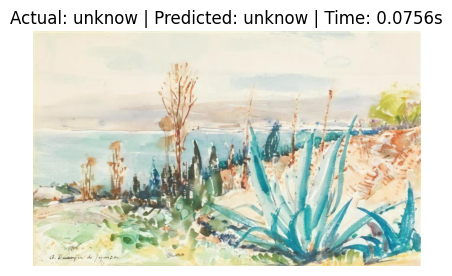

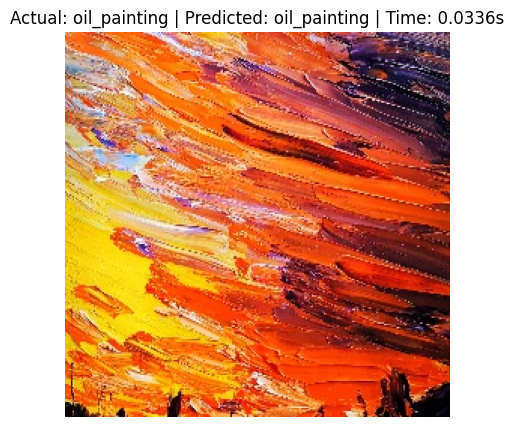

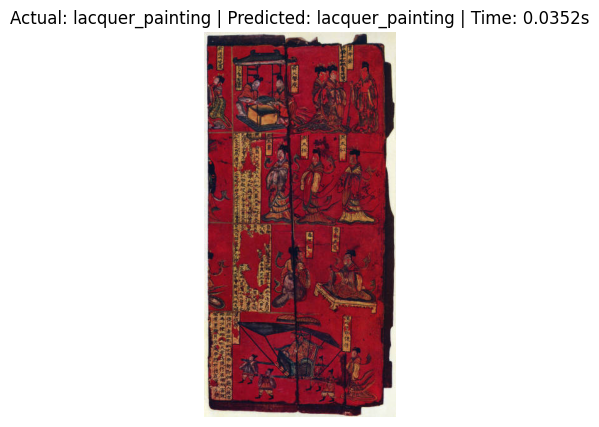

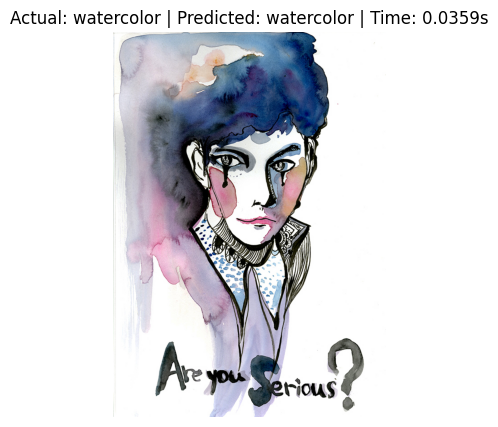

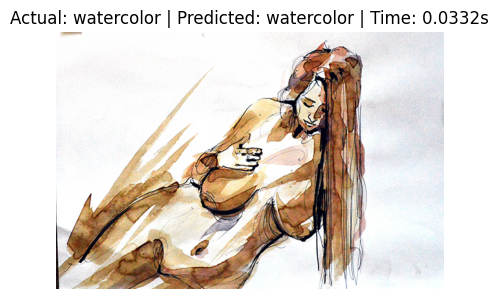

...

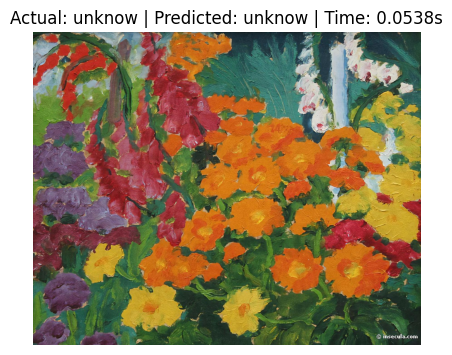

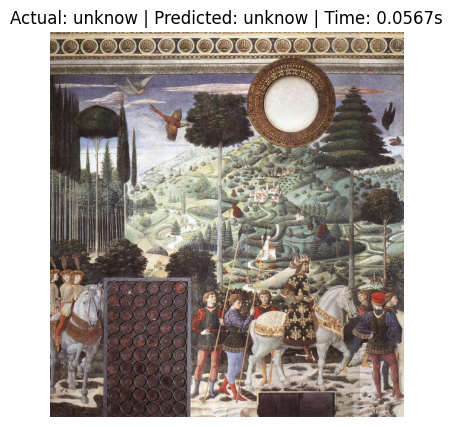

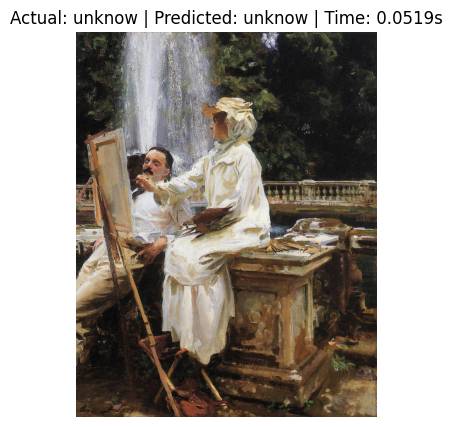

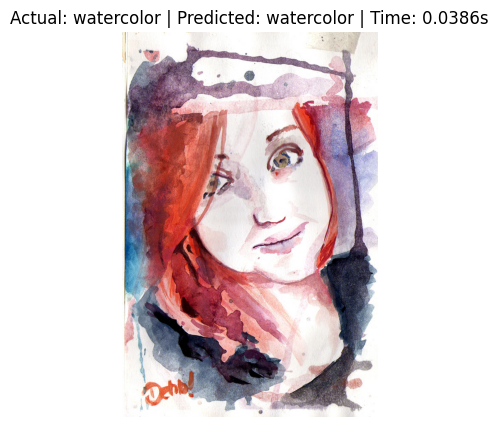

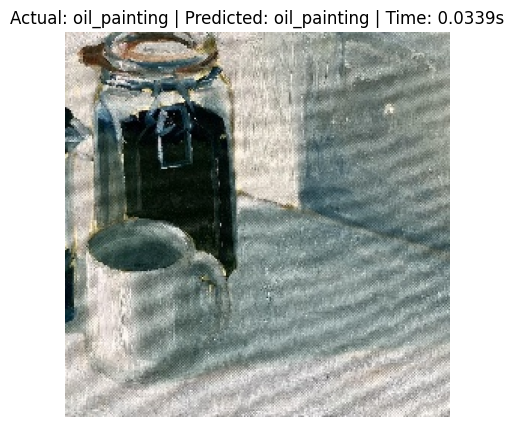

In [19]:
import random
import time
from fastai.vision.all import *

# Số lượng ảnh muốn hiển thị
n_samples = 50

# Chọn ngẫu nhiên các index từ tập valid
random_idxs = random.sample(range(len(dls.valid_ds)), n_samples)

# Hiển thị các ảnh cùng với nhãn thực tế, nhãn dự đoán và thời gian dự đoán
for idx in random_idxs:
    img, label = dls.valid_ds[idx]

    start_time = time.time()  # Bắt đầu đo thời gian
    pred, _, _ = learn.predict(img)  # Lấy nhãn dự đoán
    end_time = time.time()  # Kết thúc đo thời gian

    inference_time = end_time - start_time  # Tính thời gian dự đoán

    # Hiển thị ảnh với thông tin dự đoán
    img.show(title=f"Actual: {dls.vocab[label]} | Predicted: {pred} | Time: {inference_time:.4f}s")


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


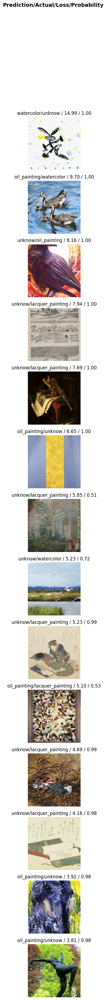

In [20]:
interp.plot_top_losses(14, nrows=14)

In [21]:
from fastai.vision.all import load_learner

learn = load_learner('model.pkl')  # Load lại learner